In [1]:
import pandas as pd 
import matplotlib.pylab as plt 
import numpy as np 

%matplotlib inline

In [2]:
data = pd.read_csv('./pima-data.csv')    

In [3]:
data.head()

,num_preg,glucose_conc,diastolic_bp,thickness,insulin,bmi,diab_pred,age,skin,diabetes
0,6,148,72,35,0,33.6,0.627,50,1.3790,True
1,1,85,66,29,0,26.6,0.351,31,1.1426,False
2,8,183,64,0,0,23.3,0.672,32,0.0000,True
3,1,89,66,23,94,28.1,0.167,21,0.9062,False
4,0,137,40,35,168,43.1,2.288,33,1.3790,True


In [4]:
data.isnull().values.any()

False

In [5]:
data.corr()

,num_preg,glucose_conc,diastolic_bp,thickness,insulin,bmi,diab_pred,age,skin,diabetes
num_preg,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,-0.081672,0.221898
glucose_conc,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.057328,0.466581
diastolic_bp,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.207371,0.065068
thickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,1.000000,0.074752
insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.436783,0.130548
bmi,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.392573,0.292695
diab_pred,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.183928,0.173844
age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,-0.113970,0.238356
skin,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,1.000000,0.074752
diabetes,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,0.074752,1.000000


In [28]:
data.corr()['diab_pred'].sort_values(ascending = False) 
  

diab_pred       1.000000
insulin         0.185071
skin            0.183928
thickness       0.183928
diabetes        0.173844
bmi             0.140647
glucose_conc    0.137337
diastolic_bp    0.041265
age             0.033561
num_preg       -0.033523
Name: diab_pred, dtype: float64

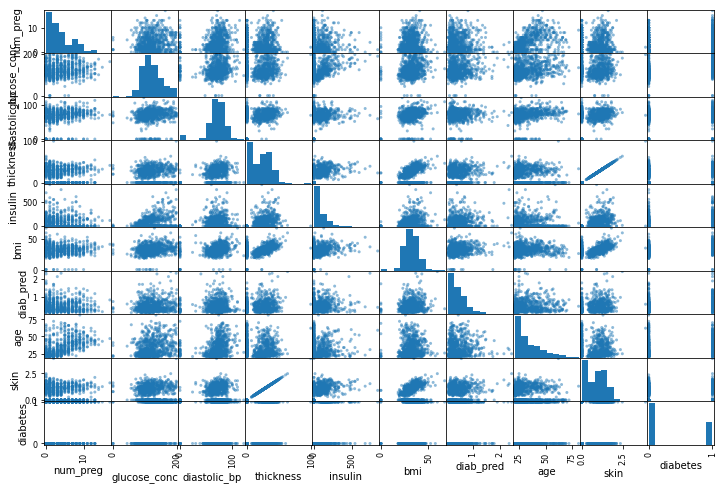

In [26]:
# import seaborn as sns
# import matplotlib.pyplot as plt 
from pandas.plotting import scatter_matrix

corr_mat = data.corr()
top_corr_features = corr_mat.index
# plt.figure(figsize=(20 , 20))

# g-sns.heatmap(data[top_corr_features].corr() , annot = True , cmp = "RdY1Gn")


# import matplotlib.pyplot as plt
# %matplotlib inline
# data.hist(bins = 50)
# plt.show()

scatter_matrix(data[top_corr_features],figsize=(12,8))
plt.show()

In [25]:
diabetes_map = {True : 1 , False : 0}
data['diabetes'] = data['diabetes'].map(diabetes_map)
data.head()

,num_preg,glucose_conc,diastolic_bp,thickness,insulin,bmi,diab_pred,age,skin,diabetes
0,6,148,72,35,0,33.6,0.627,50,1.3790,1
1,1,85,66,29,0,26.6,0.351,31,1.1426,0
2,8,183,64,0,0,23.3,0.672,32,0.0000,1
3,1,89,66,23,94,28.1,0.167,21,0.9062,0
4,0,137,40,35,168,43.1,2.288,33,1.3790,1


In [8]:
diabetes_true_count = len(data.loc[data['diabetes']== True])
diabetes_false_count = len(data.loc[data['diabetes']== False]) 

In [9]:
print(diabetes_false_count , diabetes_true_count)

500 268


In [11]:
data.index

RangeIndex(start=0, stop=768, step=1)

In [13]:
from sklearn.model_selection import train_test_split
feature_columns = ['num_preg' , 'glucose_conc',	'diastolic_bp',	'thickness', 'insulin',	'bmi',	'diab_pred',	'age',	'skin']
predicted_class = ['diabetes']

In [23]:
x = data[feature_columns].values
y = data[predicted_class].values

X_train , X_test , y_train , y_test = train_test_split(x , y , test_size = 0.3 , random_state = 10)

In [38]:
print(f"Total No of rows : {len(data)}")
print(f"No of Zeros in num_preg : {len(data.loc[data['num_preg'] == 0])}")
print(f"No of Zeros in glucose_conc : {len(data.loc[data['glucose_conc'] == 0])}")
print(f"No of Zeros in diastolic_bp : {len(data.loc[data['diastolic_bp'] == 0])}")
print(f"No of Zeros in thickness : {len(data.loc[data['thickness'] == 0])}")
print(f"No of Zeros in insulin : {len(data.loc[data['insulin'] == 0])}")
print(f"No of Zeros in bmi : {len(data.loc[data['bmi'] == 0])}")
print(f"No of Zeros in diab_pred : {len(data.loc[data['diab_pred'] == 0])}")

Total No of rows : 768
No of Zeros in num_preg : 111
No of Zeros in glucose_conc : 5
No of Zeros in diastolic_bp : 35
No of Zeros in thickness : 227
No of Zeros in insulin : 374
No of Zeros in bmi : 11
No of Zeros in diab_pred : 0


In [44]:
from sklearn.impute import SimpleImputer
fill_values = SimpleImputer(missing_values=0 , strategy="mean")
X_train = fill_values.fit_transform(X_train)
X_test = fill_values.fit_transform(X_test)

In [61]:
# print(x[: , 2])
Y_raval = y_train.ravel()

In [63]:
from sklearn.ensemble import RandomForestClassifier
random_forest_model = RandomForestClassifier(random_state=10)
random_forest_model.fit(X_train , y_train.ravel())

RandomForestClassifier(random_state=10)

In [68]:
predict_test_data = random_forest_model.predict(X_test)
# print(predict_test_data)
from sklearn import metrics

print(metrics.accuracy_score(y_test , predict_test_data))
 

0.7532467532467533
